In [18]:
import requests
url="https://raw.githubusercontent.com/Pradeep39/covid19-analytics/master/utilities/covid19.py"
exec(requests.get(url).text)

In [19]:
covid_pdf=ingest()
covid_ts_pdf=get_covid_ts(covid_pdf)
covid_ts_pdf.head(3)

,Country,Date,Confirmed,DateTime,Deaths,Recovered,country,name,latitude,longitude
0,China,01/22/20,548,2020-01-22,17,28,CN,China,35.86166,104.195397
1,China,01/23/20,643,2020-01-23,18,30,CN,China,35.86166,104.195397
2,China,01/24/20,920,2020-01-24,26,36,CN,China,35.86166,104.195397


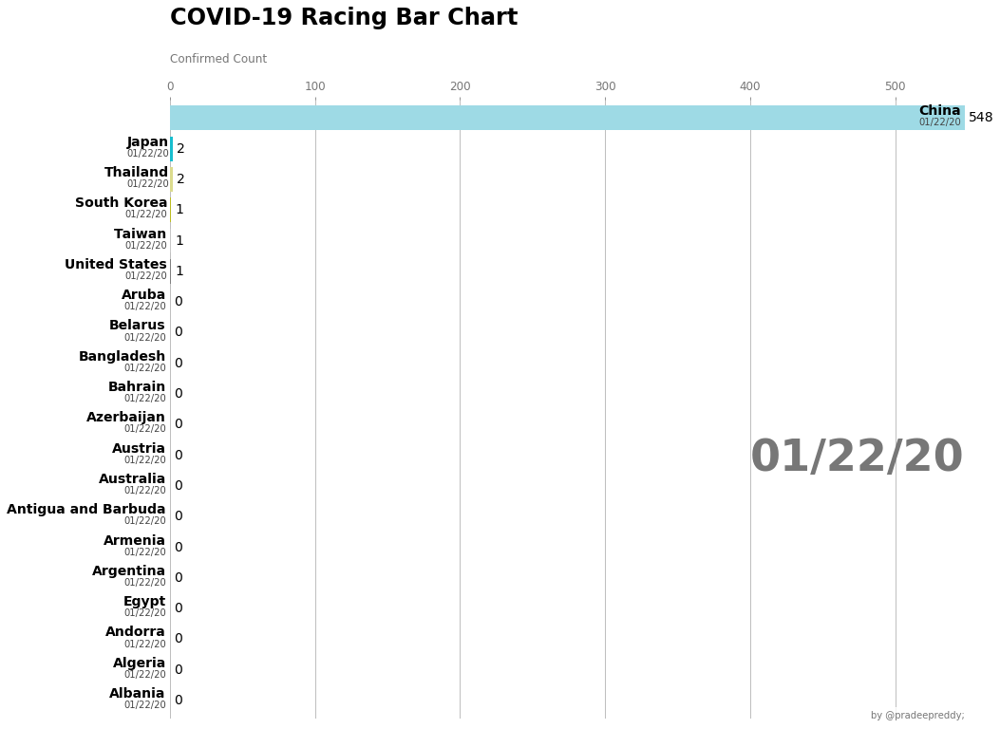

In [20]:
import os
os.chdir('/tmp/')
from datetime import date, timedelta
import datetime
fig, ax = plt.subplots(figsize=(15, 12))
sdate = date(2020, 1, 22)   # start date
edate = datetime.date.today() #+datetime.timedelta(days = 1)   # end date
periods = (edate - sdate).days       # as timedelta
rng = pd.date_range(sdate,periods=periods, freq='d').strftime('%m/%d/%y')
animator = animation.FuncAnimation(fig, draw_barchart, frames=rng,interval=800,repeat=False,
                                   fargs=("Date","Confirmed","Country",covid_ts_pdf,20,"COVID-19 Racing Bar Chart"))
HTML(animator.to_jshtml())

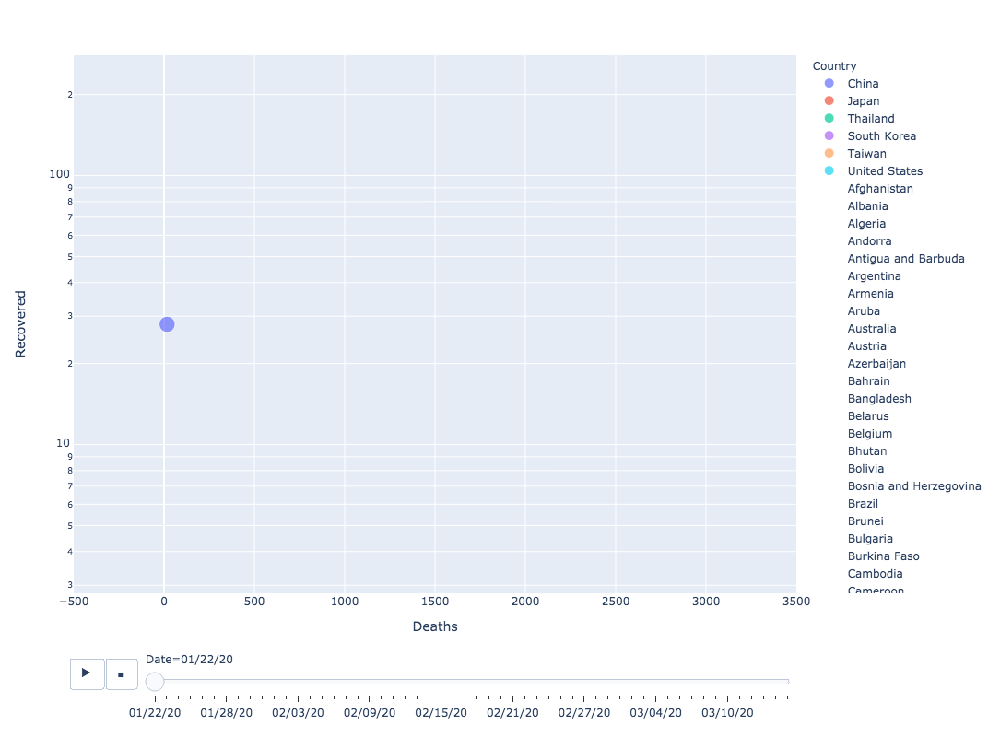

In [9]:
import plotly.express as px
fig = px.scatter(covid_ts_pdf, x="Deaths", y="Recovered", animation_frame="Date", animation_group="Country",
           size="Confirmed", color="Country", hover_name="Country", 
           range_x=[-500,3500], 
           #range_y=[-500,5000],
           log_x=False,log_y=True,
           height=800,
           #width=800
           size_max=150)
fig.update_layout(transition = {'duration': 500})
fig

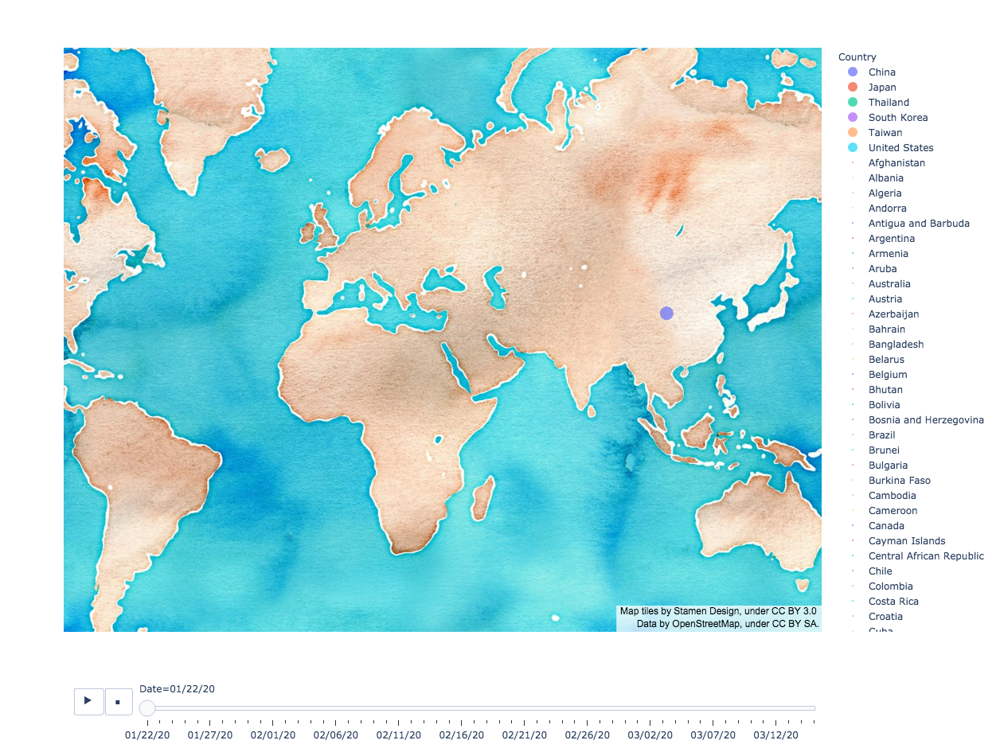

In [17]:

fig = px.scatter_mapbox(covid_ts_pdf, lat="latitude",lon="longitude", animation_frame="Date", animation_group="Country", hover_data=["Country","Confirmed","Deaths","Recovered"], size="Confirmed",color="Country",   
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=150, zoom=1.5,height=950)
  
#"open-street-map", "carto-positron", "carto-darkmatter", "stamen-terrain", "stamen-toner" or "stamen-watercolor"                
fig.update_layout(mapbox_style="stamen-watercolor")
#fig.update_layout(mapbox_style="open-street-map")
#fig.update_layout(transition_duration=30000)
#fig.layout.update(transition = {'duration': 40000})
fig